In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimage
import os
import random

import cv2
import sqlite3

from tensorflow import keras

from tensorflow.keras import applications, models
from tensorflow.keras.layers import Dense, BatchNormalization
from tensorflow.keras.models import Model

import seaborn as sns


from utils import create_model, load_images, load_backgrounds, train_gen_overlay2

In [8]:
images_path = "countries/data/flags/PNG-128/"

trained_model = applications.InceptionV3(weights="imagenet")
module = applications.inception_v3
width, height = 299, 299

df = pd.read_sql_table("Countries", "sqlite:///countries/data/sqlite/countries.db")


images, masks = load_images(df, images_path,  module)

n_classes = images.shape[0]
y = np.identity(n_classes)

assert df.notnull().all().all()

for col in ['code3l', 'code2l', 'name', 'name_official', 'flag_32',
       'flag_128']:
    assert (df[col].value_counts() == 1).all()
    
    
backgrounds = load_backgrounds("val2017/*.jpg", module, width, height, lim=1000)

In [8]:

seq2 = create_model(n_classes, train_batch_norm=False)

In [9]:
train_share = 0.7

idx_train_imgs = random.sample(range(n_classes), int(n_classes * train_share))
#idx_test_imgs = list(set(range(n_classes)).difference(idx_train_imgs))

n_backgrounds = len(backgrounds)
idx_train_backgrounds = random.sample(range(n_backgrounds), int(n_backgrounds * train_share))
#idx_test_backgrounds = set(range(n_backgrounds)).difference(idx_train_backgrounds)

In [10]:
train_images = images[idx_train_imgs]
#test_images = images[idx_test_imgs]

train_masks = masks[idx_train_imgs]
#test_masks = masks[idx_test_imgs]

train_backgrounds = [backgrounds[i] for i in idx_train_backgrounds]
#test_backgrounds = [backgrounds[i] for i in idx_test_backgrounds]

In [11]:
all([len(x.shape) == 3 for x in train_backgrounds]), all([x.shape[2] == 3 for x in train_backgrounds])

(True, True)

In [14]:
train_steps = 8 
batch_size = 128
train_gen = train_gen_overlay2(batch_size, train_backgrounds, images, masks)
#test_gen = train_gen_overlay2(batch_size, test_backgrounds, images, masks)

seq2.load_weights("inception3_run_[]_cls_250_lr_0.001_bs_128_ts_8_tp_11047162_950.hdf5")

lr = 0.001
#seq2.compile(keras.optimizers.Adam(lr), loss="categorical_crossentropy", metrics=["accuracy"])
#seq2.summary()

In [13]:
trainable_params = sum([keras.backend.count_params(weight) for weight in seq2.trainable_weights])

head_layers = []
rand_id = np.random.randint(10000)
n_layers = len(seq2.layers)
n_nodes_last = seq2.layers[-1].output_shape[1]
run_name = f"run_{head_layers}_cls_{n_nodes_last}_lr_{lr}_bs_{batch_size}_ts_{train_steps}_tp_{trainable_params}_{rand_id}"
print(run_name)

run_[]_cls_250_lr_0.001_bs_128_ts_8_tp_11047162_950


In [17]:
print(f"train_steps={train_steps} ")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=f"logs/{run_name}")
seq2.fit(train_gen, epochs=600,
         steps_per_epoch=train_steps, callbacks=[tensorboard_callback])

train_steps=8 
Epoch 1/600
1/8 [==>...........................] - ETA: 0s - loss: 5.7228 - accuracy: 0.0078WARNING:tensorflow:From /Users/grisha.oryol/Documents/projects/opencv/lib/python3.6/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
8/8 [==============================] - 197s 25s/step - loss: 5.6150 - accuracy: 0.0039
Epoch 2/600
8/8 [==============================] - 176s 22s/step - loss: 5.5331 - accuracy: 0.0039
Epoch 3/600
8/8 [==============================] - 174s 22s/step - loss: 5.5226 - accuracy: 0.0059
Epoch 4/600
8/8 [==============================] - 174s 22s/step - loss: 5.5386 - accuracy: 0.0059
Epoch 5/600
8/8 [==============================] - 168s 21s/step - loss: 5.5295 - accuracy: 0.0039
Epoch 6/600
8/8 [==============================] - 160s 20s/step - loss: 5.5209 - accuracy: 0.006

KeyboardInterrupt: 

In [18]:
seq2.save_weights(f"inception3_{run_name}.hdf5")

In [ ]:
# seq2 = create_model()
# seq2.load_weights(f"inception3_{run_name}.hdf5")

In [ ]:
# run_load = "run_[]_cls_250_lr_0.001_bs_512_ts_8_8550"
# seq3 = create_model()
# seq3.load_weights(f"inception3_{run_load}.hdf5")

In [ ]:
train_steps = 1 # 8

run_load = "run_[]_cls_250_lr_0.001_bs_512_ts_8_8550"
seq4 = create_model()
seq4.load_weights(f"inception3_{run_load}.hdf5")


batch_size = 128
train_gen = train_gen_overlay2(batch_size, train_backgrounds, images, masks)
test_gen = train_gen_overlay2(batch_size, test_backgrounds, images, masks)

lr = 0.0001
seq4.compile(keras.optimizers.Adam(lr), loss="categorical_crossentropy", metrics=["accuracy"])

trainable_params = sum([keras.backend.count_params(weight) for weight in seq4.trainable_weights])
rand_id = np.random.randint(10000)
n_layers = len(seq4.layers)
n_nodes_last = seq4.layers[-1].output_shape[1]
head_layers = []
run_name = f"run_{head_layers}_cls_{n_nodes_last}_lr_{lr}_bs_{batch_size}_ts_{train_steps}_tp_{trainable_params}_{rand_id}"


print(f"train_steps={train_steps}")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=f"logs/{run_name}")
for _ in range(100):
    seq4.fit(train_gen, epochs=1,
             steps_per_epoch=train_steps, callbacks=[tensorboard_callback])
    diff_df = pd.DataFrame({w1.name: {"diff": avg_diff(w1.numpy(), w2.numpy()),
                                      "trainable": w1.trainable} for w1, w2 in zip(seq3.weights, 
                                                                                   seq4.weights)}).T
    display(diff_df[diff_df["diff"] > 0].sort_values(by="diff", ascending=False)[:5])

In [53]:
seq3 = create_model()

In [16]:
layer_funcs = [Model(seq2.input, [layer.output]) for layer in seq2.layers]

In [38]:
pd.set_option("display.max_columns", 100)

In [47]:
beta = seq2.layers[2].weights[0].numpy()
m_mean = seq2.layers[2].weights[1].numpy()
m_var = seq2.layers[2].weights[2].numpy()

In [129]:
beta_init = seq3.layers[2].weights[0].numpy()
m_mean_init = seq3.layers[2].weights[1].numpy()
m_var_init = seq3.layers[2].weights[2].numpy()

In [79]:
import tensorflow as tf

In [93]:
seq2.layers[2].weights[2].numpy() 

array([0.09927782, 0.04222024, 0.09610323, 0.29081458, 0.18007457,
       0.24850012, 0.00718859, 0.03631105, 0.02465883, 0.1108002 ,
       0.0441061 , 0.13933212, 0.27379096, 0.0260733 , 0.06616066,
       0.05272999, 0.19465338, 0.23547865, 0.01255865, 0.01843043,
       0.05405981, 0.02608941, 0.0796475 , 0.05894793, 0.01865277,
       0.39129573, 0.04677672, 0.228682  , 0.06743598, 0.07095978,
       0.04036761, 0.0087497 ], dtype=float32)

In [95]:
act1 = layer_funcs[1](batch, training=False).numpy()
seq2.layers[2]._calculate_mean_and_var(tf.Variable(act1), reduction_axes=(0, 1, 2), keep_dims=False)

(<tf.Tensor: shape=(32,), dtype=float32, numpy=
 array([-2.4133219e-01, -1.6854124e-01, -3.9219549e-01,  3.7117083e-02,
        -4.3534294e-01, -4.1454118e-01, -9.9356873e-03,  5.1234469e-02,
         6.6109784e-02, -1.7072813e-01,  7.0585243e-02, -5.9611436e-02,
         2.9246151e-02, -2.8024005e-02, -2.2852118e-01,  9.3871228e-02,
         2.6864287e-01, -5.0239944e-01, -2.1545513e-02, -1.7538641e-02,
         2.2896279e-04, -6.0181012e-03, -1.2678774e-01,  6.8768740e-02,
         2.4645010e-02,  6.7117548e-01, -4.0715441e-02,  1.2687932e-01,
         1.7997655e-01,  2.2477613e-01, -9.2323989e-02,  1.0944200e-01],
       dtype=float32)>,
 <tf.Tensor: shape=(32,), dtype=float32, numpy=
 array([0.6760934 , 0.14815858, 0.85210955, 1.6625317 , 1.2733797 ,
        1.181992  , 0.04632797, 0.24260601, 0.07438553, 0.5431838 ,
        0.15446147, 1.0583    , 1.5270702 , 0.15174156, 0.45871037,
        0.18317491, 0.48662665, 2.0342467 , 0.07161462, 0.11674363,
        0.28656033, 0.10925256,

-1.0

In [94]:
acts = []
for _ in range(1):
    batch, y_batch = next(train_gen)
    act1 = layer_funcs[1](batch, training=False).numpy()
    acts.append(act1)

-1.0 1.0078433
0.0 1.0
-1.0 1.0
0.0 1.0


In [114]:
act_batch = layer_funcs[1](batch, training=False).numpy()
var_batch = seq2.layers[2]._calculate_mean_and_var(tf.Variable(act_batch), reduction_axes=(0, 1, 2), keep_dims=False)[1]

act_one = layer_funcs[1](batch[[0]], training=False).numpy()
var_one = seq2.layers[2]._calculate_mean_and_var(tf.Variable(act_one), reduction_axes=(0, 1, 2), keep_dims=False)[1]

In [115]:
act_batch = layer_funcs[2](batch, training=False).numpy()
act_one = layer_funcs[2](batch[[0]], training=False).numpy()


In [113]:
(act_batch[[0]] / act_one).min()

0.9999974

In [109]:
act_one.shape

(1, 149, 149, 32)

In [67]:
seq2.layers[2].weights[0].numpy() / seq3.layers[2].weights[0].numpy()

array([0.99340796, 1.        , 1.002483  , 0.99846864, 1.0169821 ,
       1.0003453 , 0.92275465, 1.0008087 , 1.        , 0.97268903,
       1.        , 0.8193224 , 1.0736481 , 0.9997492 , 1.        ,
       1.        , 1.0022849 , 0.93246514, 1.        , 1.0041251 ,
       1.004306  , 1.5844169 , 0.99663544, 1.        , 0.9984973 ,
       0.9832838 , 1.        , 0.9986899 , 1.        , 1.        ,
       1.        , 1.0190966 ], dtype=float32)

array([ 0.30642197, -1.408146  ,  1.2066168 ,  4.060442  ,  0.46849713,
        3.7279217 , -0.19197   ,  1.1407069 , -1.0027769 , -0.39678496,
       -0.7832382 , -0.06940158,  0.46450683,  1.8760432 , -0.81689674,
       -1.2841663 ,  4.242368  ,  0.07444862, -1.0287153 ,  1.8559531 ,
        1.0826433 ,  0.02630073, -0.74120116, -1.2152895 , -0.82486725,
        0.7499853 , -1.4319235 ,  1.7412437 , -0.751229  , -1.2139478 ,
       -1.441984  , -0.63903415], dtype=float32)

array([0.33156815, 0.13971157, 0.32001787, 0.9697031 , 0.6014242 ,
       0.8263911 , 0.02400758, 0.12124109, 0.08234932, 0.37005344,
       0.14611423, 0.46507058, 0.9134309 , 0.0870445 , 0.22095607,
       0.17579377, 0.64984983, 0.7864328 , 0.04192145, 0.06154748,
       0.18055663, 0.08713192, 0.26532215, 0.1964495 , 0.06226327,
       1.3068284 , 0.1558016 , 0.76300645, 0.22516336, 0.2364873 ,
       0.13452013, 0.02897254], dtype=float32)

/Users/grisha.oryol/Documents/projects/opencv/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


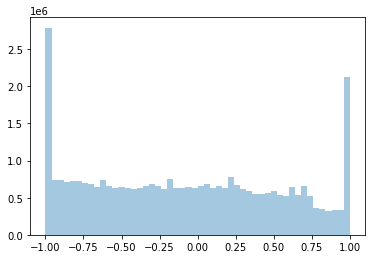

In [54]:
sns.distplot(batch, kde=False)

In [108]:
#acts_train = [layer_func(batch) for layer_func in layer_funcs[:10]]

acts = [layer_func(batch, training=False) for layer_func in layer_funcs[:5]]

acts_one = [layer_func(batch[[0]], training=False) for layer_func in layer_funcs[:5]]

In [110]:
seq2.layers[2].trainable

False

In [84]:
acts_train = [layer_func(batch[[0]], training=True) for layer_func in layer_funcs[:5]]

In [116]:
acts_one[2][0].numpy() / acts[2][0].numpy()

array([[[1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        ...,
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ]],

       [[1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        ...,
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
         1.       ],
        [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
   

In [87]:
batch_mean_train = np.mean(acts_train[1], axis=(0, 1, 2))
batch_var_train = np.var(acts_train[1], axis=(0, 1, 2))

batch_mean_test = np.mean(acts[1], axis=(0, 1, 2))
batch_var_test = np.var(acts[1], axis=(0, 1, 2))

one_mean_test = np.mean(acts_one[1], axis=(0, 1, 2))
one_var_test = np.var(acts_one[1], axis=(0, 1, 2))

In [81]:
 m_var

array([0.6921919 , 0.1469229 , 0.5249175 , 1.4087611 , 1.173867  ,
       0.9734576 , 0.048275  , 0.17546803, 0.10664053, 0.49956697,
       0.1560237 , 0.8428369 , 1.4950237 , 0.11896742, 0.39888257,
       0.20899425, 0.8054407 , 1.8208985 , 0.06448536, 0.08476966,
       0.23209363, 0.09914461, 0.29412276, 0.2596505 , 0.08925465,
       2.9833508 , 0.19361395, 1.1233878 , 0.24557792, 0.32084844,
       0.16206928, 0.06570315], dtype=float32)

In [82]:
batch_var_test

array([1.1562562 , 0.1515042 , 0.8390913 , 1.9480226 , 1.7932316 ,
       1.220957  , 0.07543126, 0.25806376, 0.13425492, 0.5862159 ,
       0.17322317, 1.2874984 , 2.1643424 , 0.1553748 , 0.5725625 ,
       0.2830051 , 1.0251858 , 3.0274055 , 0.0821414 , 0.11852624,
       0.31410077, 0.11770015, 0.3598269 , 0.3301394 , 0.1258072 ,
       4.9620113 , 0.2594508 , 1.4310364 , 0.27832115, 0.4958359 ,
       0.21663557, 0.10843869], dtype=float32)

In [83]:
one_var_test

array([0.9842208 , 0.14699012, 0.81840694, 0.60713667, 1.6799164 ,
       0.9324881 , 0.05386317, 0.28834358, 0.10036059, 0.4091881 ,
       0.07543795, 0.89394236, 1.4746464 , 0.19929023, 0.5383099 ,
       0.12522654, 0.93638533, 2.5090756 , 0.09550191, 0.14552274,
       0.39469716, 0.14829065, 0.13572699, 0.11720579, 0.13965563,
       4.5481954 , 0.08392298, 0.64867765, 0.19912231, 0.40967152,
       0.11789586, 0.10229072], dtype=float32)

Why variance weight is so big in the first batch normalization layer?

In [68]:
#(beta[0] + (acts_train[1][:, :, :, 0] - batch_mean_train[0]) / ((batch_var_train[0] + 0.001) ** 0.5) )/ acts_train[2][:, :, :, 0]

In [152]:
pd.Series([np.abs((beta[i] + (acts_train[1][:, :, :, i] - batch_mean_train[i]) 
                   / ((batch_var_train[i] + 0.001) ** 0.5) )/ acts_train[2][:, :, :, i] - 1).max() for i in range(32)]).max()

0.02380955219268799

In [96]:
for i in range(32):
    print(np.abs((beta[i] + (acts[1][:, :, :, i] - m_mean[i]) / ((m_var[i] + 0.001) ** 0.5) )/ acts[2][:, :, :, i] - 1).max())

1.1920929e-07
1.1920929e-07
1.7881393e-07
1.1920929e-07
1.1920929e-07
1.7881393e-07
2.3841858e-07
1.1920929e-07
1.1920929e-07
4.172325e-07
2.5451183e-05
1.1920929e-07
2.3841858e-07
1.1920929e-07
1.1920929e-07
1.1920929e-07
1.1920929e-07
2.3841858e-07
1.1920929e-07
1.1920929e-07
1.1920929e-07
0.00027894974
1.1920929e-07
2.3841858e-07
2.3841858e-07
1.1920929e-07
1.1920929e-07
3.5762787e-07
1.7881393e-06
3.5762787e-07
1.1920929e-07
2.3841858e-07


In [91]:
#acts_one = [layer_func([batch[[idx]], keras.backend.learning_phase()]) for layer_func in layer_funcs[:1]]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


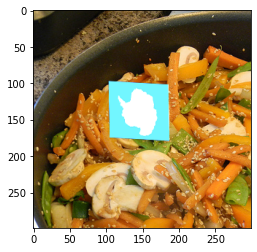

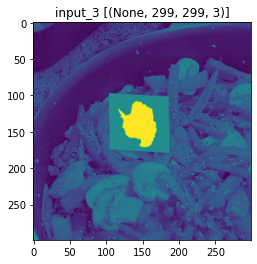

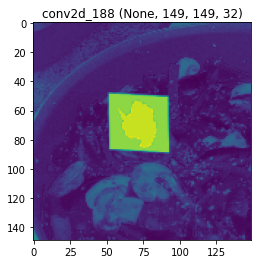

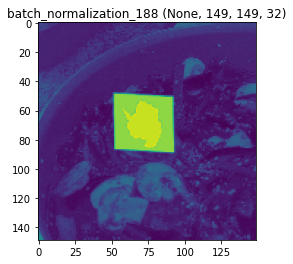

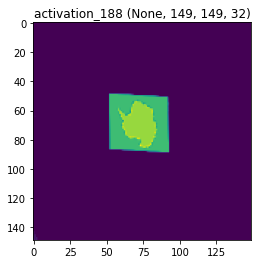

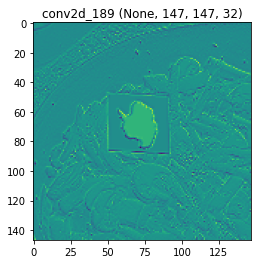

In [57]:
idx = 1
plt.imshow((batch[idx] + 1) * 0.5)
plt.show()
for i, act in enumerate(acts):
    plt.imshow(act[idx][:, :, 1])
    plt.title(f"{seq2.layers[i].name} {seq2.layers[i].output_shape}")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


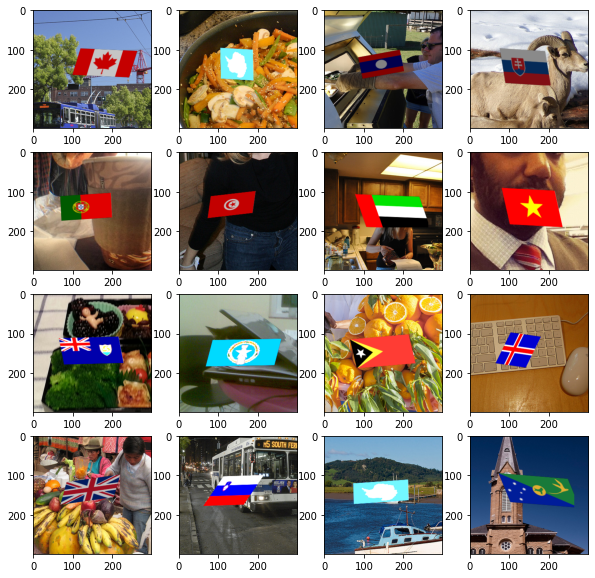

In [43]:
show_batch(batch)

In [14]:
def avg_diff(w1, w2):
    return np.mean((w1 / w2 - 1) ** 2) ** 0.5

In [14]:
diff_df = pd.DataFrame({w1.name: {"diff": avg_diff(w1.numpy(), w2.numpy()),
                                  "trainable": w1.trainable} for w1, w2 in zip(seq3.weights, 
                                                                               seq4.weights)}).T
diff_df[diff_df["diff"] > 0].sort_values(by="diff", ascending=False)[:5]

NameError: name 'seq3' is not defined

In [101]:
diff_df.loc[diff_df.index.str.find("batch_normalization") > -1]["diff"].abs().max()

0.0

In [108]:
next_train = next(train_gen)

max_scale 2.3359375
scale 0.9458201586918412


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


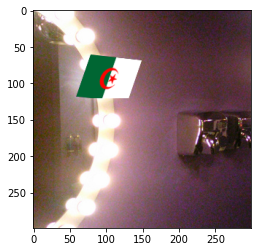

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


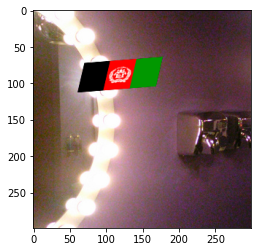

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


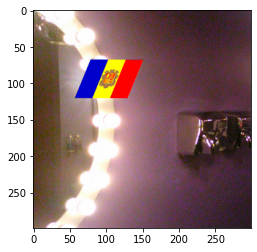

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


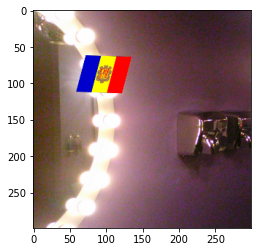

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


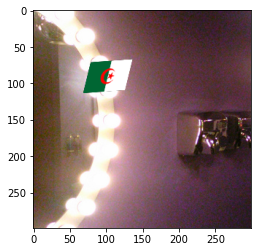

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


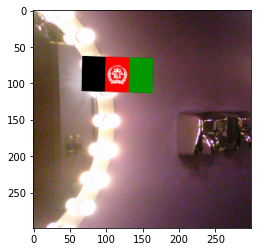

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


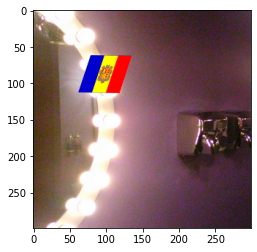

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


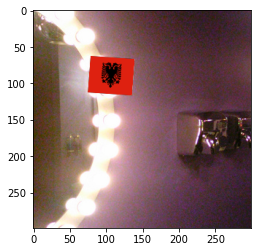

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


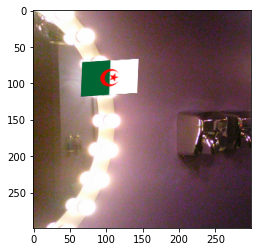

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


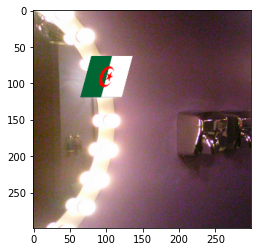

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


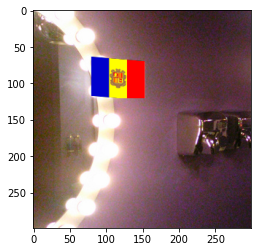

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


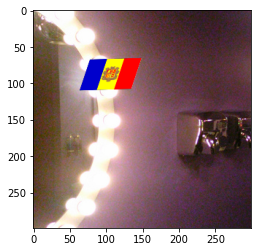

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


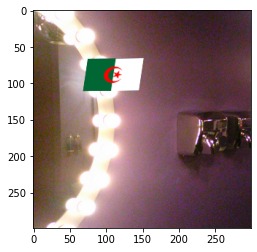

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


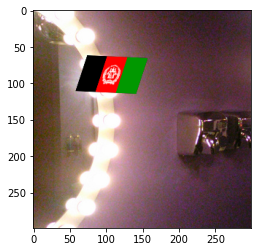

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


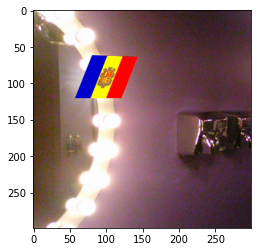

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


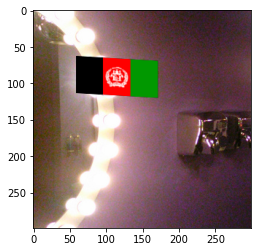

In [109]:
for im in next_train[0]:
    plt.imshow((im + 1) * 0.5 * 256)
    plt.show()

In [49]:
np.var(batch, axis=(0, 1, 2))

array([0.5491505 , 0.4513772 , 0.48535907], dtype=float32)

In [64]:
idx = np.random.choice(range(batch_size), size=batch_size, replace=False)

In [82]:
batch[idx, 1, 0, 0].sum()

6.8156896

In [85]:
y_batch.shape

(128, 250)

In [83]:
batch[range(batch_size), 1, 0, 0].sum()

6.815688

In [102]:
batch0 = np.array([batch[1]] * batch_size)
y_batch0 = np.array([y_batch[1]] * batch_size)

In [103]:
# run_load = "run_[]_cls_250_lr_0.001_bs_512_ts_8_8550"
# seq4 = create_model()
# seq4.load_weights(f"inception3_{run_load}.hdf5")



for i in range(10):
    
    probs_bb = []
    res_bb = []
    images_test_bb = []

    for j in range(1):
        print(j)
        batch, y_batch = next(train_gen)
        preds_one = seq2(batch, training=False).numpy()
        pred_one = preds_one.argmax(axis=1)
        y_one = y_batch0.argmax(axis=1)
        res_bb.append(pd.DataFrame({"pred": pred_one, "y": y_one}))
        probs_bb.append(pd.DataFrame(preds_one))
        images_test_bb.append(batch)

    res_bb = pd.concat(res_bb, ignore_index=True)
    probs_bb = pd.concat(probs_bb, ignore_index=True)

    res_bb["wrong"] = res_bb["pred"] != res_bb["y"]
    res_bb["correct"] = res_bb["pred"] == res_bb["y"]
    loss_bb = - np.log(probs_bb).values[np.arange(probs_bb.shape[0]), res_bb["y"].values]


    res_bb["loss"] = loss_bb
    print(res_bb["correct"].mean())

0
0.0
0
0.0
0


KeyboardInterrupt: 

In [35]:
res_bb["correct"].mean()

TypeError: list indices must be integers or slices, not str

In [66]:
0.859375

(128, 299, 299, 3)

In [69]:
images.min(), images.max()

(-1.0, 1.0078433)

In [20]:
probs = []
res = []
images_test = []

for j in range(10):
    print(j)
    batch, y_batch = next(train_gen)
    for i in range(batch_size):
        preds_one = seq2(batch[[i]], training=False).numpy()
        pred_one = preds_one.argmax(axis=1)
        y_one = y_batch[[i]].argmax(axis=1)
        res.append(pd.DataFrame({"pred": pred_one, "y": y_one}))
        probs.append(pd.DataFrame(preds_one))
        images_test.append(batch)

res = pd.concat(res, ignore_index=True)
probs = pd.concat(probs, ignore_index=True)


res["wrong"] = res["pred"] != res["y"]
res["correct"] = res["pred"] == res["y"]
loss = - np.log(probs).values[np.arange(probs.shape[0]), res["y"].values]
res["loss"] = loss

res["correct"].mean()

0
1
2
3
4
5
6
7
8
9


/Users/grisha.oryol/Documents/projects/opencv/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log


0.85

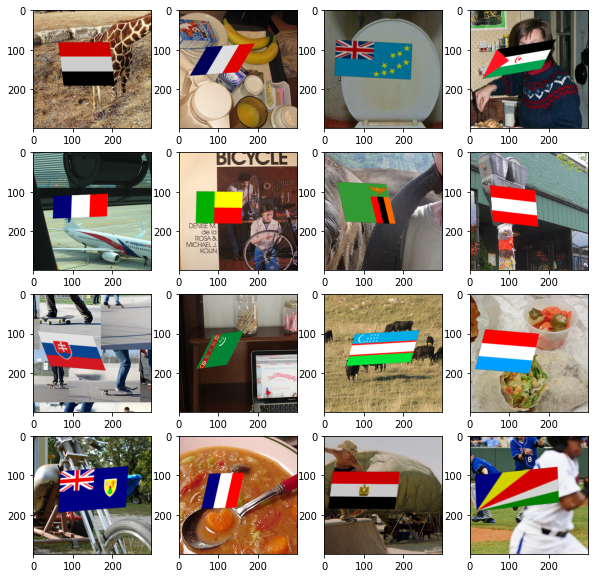

In [21]:
show_next(train_gen)

In [ ]:
probs_bb = []
res_bb = []
images_test_bb = []

for j in range(1):
    print(j)
    batch = []
    y_batch = []
    for i in range(batch_size):
        print(i)
        batch0, y_batch0 = next(train_gen)
        batch.append(batch0[i])
        y_batch.append(y_batch0[i])
    batch = np.concatenate(batch0)
    y_batch = np.concatenate(y_batch0)
    preds_one = seq2(batch, training=True).numpy()
    pred_one = preds_one.argmax(axis=1)
    y_one = y_batch.argmax(axis=1)
    res_bb.append(pd.DataFrame({"pred": pred_one, "y": y_one}))
    probs_bb.append(pd.DataFrame(preds_one))
    images_test_bb.append(batch)

res_bb = pd.concat(res_bb, ignore_index=True)
probs_bb = pd.concat(probs_bb, ignore_index=True)

res_bb["wrong"] = res_bb["pred"] != res_bb["y"]
res_bb["correct"] = res_bb["pred"] == res_bb["y"]
loss_bb = - np.log(probs_bb).values[np.arange(probs_bb.shape[0]), res_bb["y"].values]


res_bb["loss"] = loss_bb
res_bb["correct"].mean()

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42


In [26]:
res.groupby(["pred", "y"])["wrong"].count().mean()

1.2190476190476192

In [27]:
res.groupby(["pred", "y"])["wrong"].mean().sort_values(ascending=False)

pred  y  
246   242     True
26    52      True
52    227     True
      234     True
      239     True
             ...  
129   129    False
134   134    False
135   135    False
136   136    False
4     4      False
Name: wrong, Length: 420, dtype: bool

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


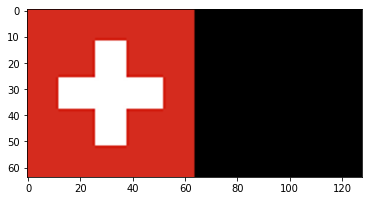

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


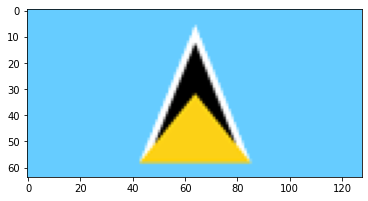

In [28]:
plt.imshow((images[158] + 1) * 0.5 * 256)
plt.show()
plt.imshow((images[136] + 1) * 0.5 * 256)
plt.show()

In [29]:
res.sort_values("loss", ascending=False)[:20]

,pred,y,wrong,correct,loss
205,175,83,True,False,16.417248
65,190,119,True,False,14.442763
30,26,21,True,False,14.028050
134,26,197,True,False,13.742855
52,26,31,True,False,13.724235
373,175,241,True,False,13.598989
328,26,236,True,False,13.048111
47,45,199,True,False,12.512232
415,45,73,True,False,12.487067
207,79,9,True,False,12.020898


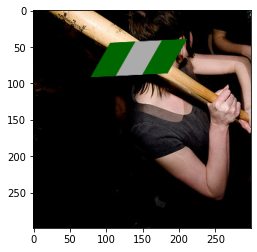

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


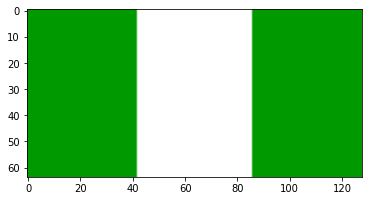

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


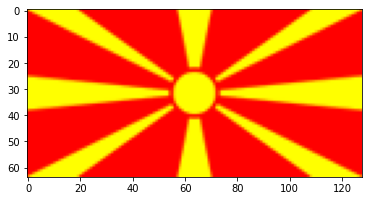

In [31]:
idx = 65
plt.imshow((images_test[idx][0] + 1) * 0.5 * 256)
plt.show()

plt.imshow((images[res.loc[idx]["y"]] + 1) * 0.5 * 256)
plt.show()

plt.imshow((images[res.loc[idx]["pred"]] + 1) * 0.5 * 256)
plt.show()

In [33]:
pd.DataFrame({"mean": res.groupby("y")["wrong"].mean(), "count": res.groupby("y")["wrong"].count()}).sort_values("mean")

,mean,count
y,,
48,0.0,1
79,0.0,2
190,0.0,1
226,0.0,2
64,0.0,2
...,...,...
106,1.0,2
107,1.0,3
108,1.0,1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


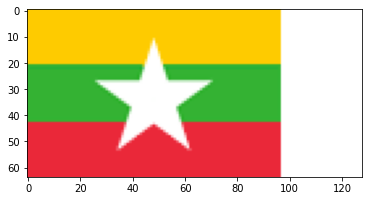

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


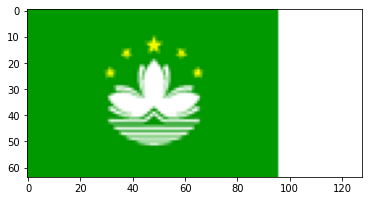

In [105]:
plt.imshow((images[111] + 1) * 0.5 * 256)
plt.show()

plt.imshow((images[223] + 1) * 0.5 * 256)
plt.show()

In [81]:
crosstab_abs[96].sort_values()

pred
0      0
160    0
161    0
162    0
163    0
      ..
182    1
114    2
199    2
32     2
223    4
Name: 96, Length: 196, dtype: int64

In [30]:
wrong_by_class = (res.groupby("y")["wrong"].sum() / res.shape[0])

In [31]:
pd.Series(wrong_by_class).sort_values(ascending=False)

y
61     0.006445
243    0.006055
65     0.006055
213    0.005859
210    0.005859
         ...   
190    0.001563
135    0.001367
17     0.001172
185    0.001172
151    0.000781
Name: wrong, Length: 250, dtype: float64

In [32]:
(res["pred"] == res["y"]).mean()

0.1419921875

In [34]:
crosstab_abs = pd.crosstab(res["pred"], res["y"])
crosstab = crosstab_abs.div(crosstab_abs.sum())

In [35]:
crosstab_abs.shape

(107, 213)

In [34]:
wrong_abs = crosstab_abs * (1 - np.eye(crosstab_abs.shape[0]))

ValueError: Unable to coerce to DataFrame, shape must be (196, 250): given (196, 196)

In [199]:
(wrong_abs.unstack().sort_values(ascending=False) / wrong_abs.sum().sum())[:10]

y   pred
14  15      0.028003
13  1       0.025055
6   7       0.024318
    9       0.022845
2   15      0.018423
3   15      0.016949
1   7       0.016212
    15      0.016212
15  14      0.015475
    3       0.015475
dtype: float64

In [36]:
largest2 = probs.T.apply(lambda x: x.sort_values().index[-2])
largest3 = probs.T.apply(lambda x: x.sort_values().index[-3])

In [37]:
(((res["y"] == res["pred"])).mean(), 
 ((res["y"] == largest2) | (res["y"] == res["pred"])).mean(),
((res["y"] == largest3) | (res["y"] == largest2) | (res["y"] == res["pred"])).mean(),
)

(0.21484375, 0.279296875, 0.337890625)

In [38]:
crosstab

y,0,1,2,3,4,5,6,7,8,9,...,238,239,240,241,242,243,244,245,246,247
pred,,,,,,,,,,,,,,,,,,,,,
4,0.0,0.0,0.0,0.0,0.5,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.333333,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.5,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
13,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
240,0.0,0.0,0.0,0.0,0.5,0.333333,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.333333,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
242,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.333333,0.000000,0.0,0.0,0.0


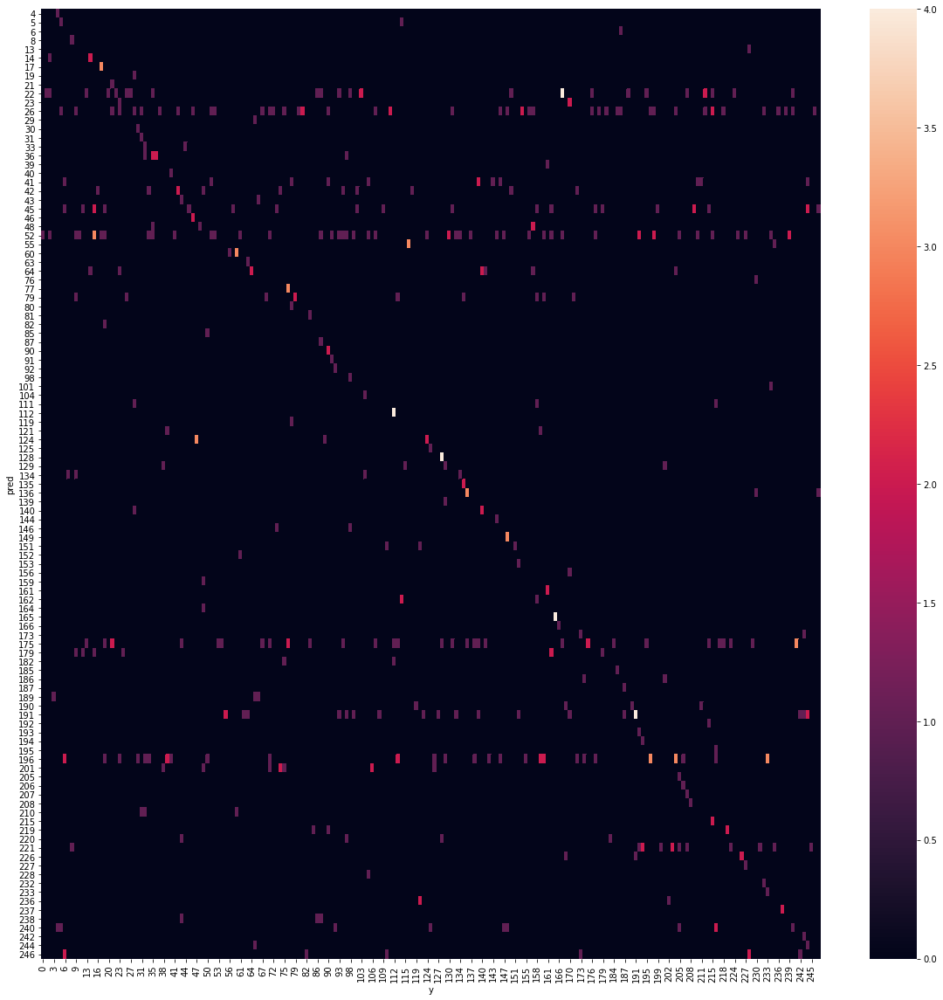

In [39]:
plt.figure(figsize=(20, 20))
sns.heatmap(crosstab_abs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


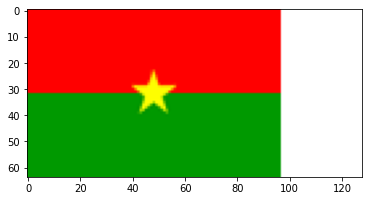

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


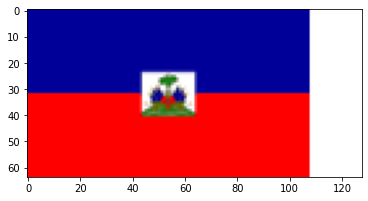

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


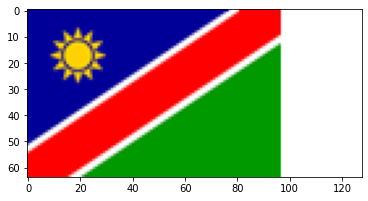

In [84]:
plt.imshow((images[25] + 1) * 0.5 * 256)
plt.show()
plt.imshow((images[69] + 1) * 0.5 * 256)
plt.show()
plt.imshow((images[112] + 1) * 0.5 * 256)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


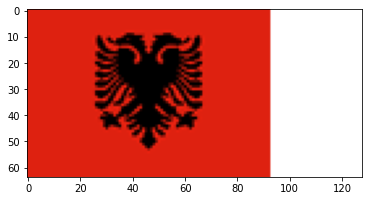

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


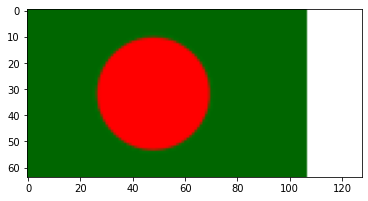

In [203]:
plt.imshow((images[1] + 1) * 0.5 * 256)
plt.show()
plt.imshow((images[13] + 1) * 0.5 * 256)

In [69]:
df.loc[13:16]

,id,enabled,code3l,code2l,name,name_official,flag_32,flag_128,latitude,longitude,zoom
13,14,True,BGD,BD,Bangladesh,People’s Republic of Bangladesh,BD-32.png,BD-128.png,24.08273251,90.49915527,7
14,15,True,BRB,BB,Barbados,Barbados,BB-32.png,BB-128.png,13.19383077,-59.54319600,11
15,16,True,BLR,BY,Belarus,Republic of Belarus,BY-32.png,BY-128.png,53.58628747,27.95338900,6
16,17,True,BEL,BE,Belgium,Kingdom of Belgium,BE-32.png,BE-128.png,50.49593874,4.46993600,8


0.875

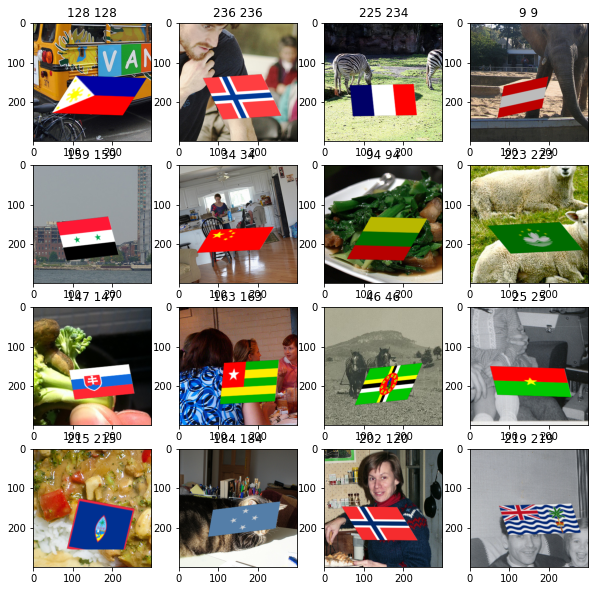

In [23]:
bs1 = 16
fig, axs = plt.subplots(bs1 // 4, 4, figsize=(10, 10))

batch, y_batch = next(train_gen)
res = []
for i in range(bs1):
    preds_one = seq2.predict(batch[[i]])[0]
    pred_one = preds_one.argmax()
    y_one = y_batch[[i]].argmax()
    #print(pred_one, y_one)
    res.append(pred_one == y_one)
    
    axs[i // 4, i % 4].imshow((batch[i] + 1) * 0.5)
    #assert ((batch[i] + 1) * 0.5 * 256).min() >= 0
    #assert ((batch[i] + 1) * 0.5 * 256).max() <= 1
    axs[i // 4, i % 4].set_title(f"{pred_one} {y_one}")
    
np.mean(res)

/Users/grisha.oryol/Documents/projects/opencv/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


KeyboardInterrupt: 

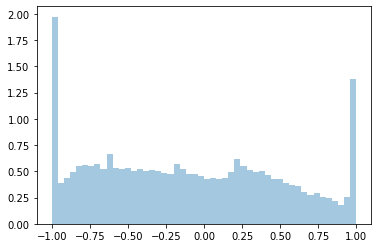

In [24]:
sns.distplot(batch)

In [104]:
import seaborn as sns

In [26]:
examples = ["albania_example.jpeg", "algeria_example_2.jpeg", "algeria_example.jpeg"]

In [29]:
preds.shape

(1, 250)

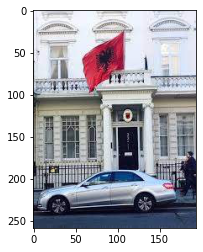

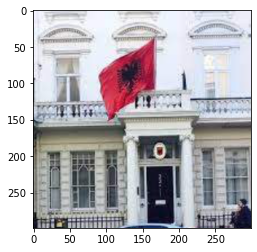

name
Panama                 0.000740
Argentina              0.000760
Iran                   0.000916
Dominican Republic     0.000962
Finland                0.001051
                         ...   
Nepal                  0.010126
Kenya                  0.010895
Barbados               0.011136
Antigua and Barbuda    0.011391
Albania                0.014810
Length: 250, dtype: float32
Albania


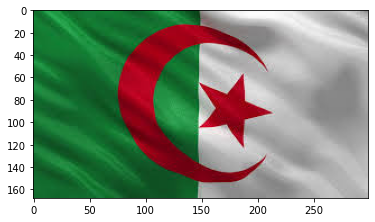

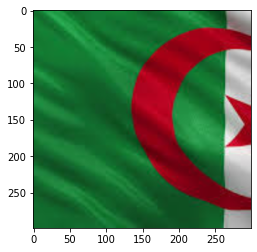

name
Cyprus                                          7.252185e-12
South Georgia and the South Sandwich Islands    1.674112e-11
Bhutan                                          5.630929e-11
Hong Kong                                       1.181032e-10
Japan                                           1.978774e-10
                                                    ...     
Aruba                                           2.541752e-02
Comoros                                         6.933449e-02
Azerbaijan                                      1.014345e-01
Rwanda                                          2.199740e-01
Gabon                                           3.467359e-01
Length: 250, dtype: float32
Gabon


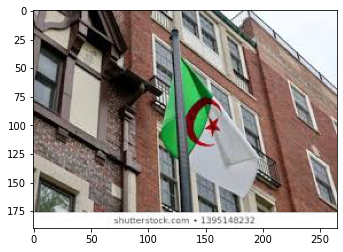

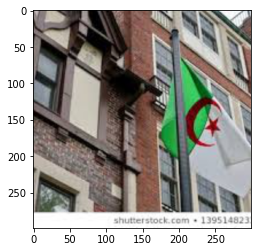

name
Saudi Arabia                        6.942953e-07
Gibraltar                           1.114291e-06
San Marino                          1.139351e-06
Iraq                                1.618807e-06
Egypt                               2.451840e-06
                                        ...     
Namibia                             4.690012e-02
Puerto Rico                         5.127038e-02
Democratic Republic of the Congo    5.825585e-02
Tokelau                             6.063520e-02
Congo                               7.957597e-02
Length: 250, dtype: float32
Congo


In [30]:
for example_fname in examples:
    example = mpimage.imread(example_fname)
    
    plt.imshow(example)
    plt.show()
    example = module.preprocess_input(example)
    min_size = min(example.shape[:2])
    resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
    resized_example = np.expand_dims(resized_example, axis=0)
#     sns.distplot(resized_example)
#     plt.show()
    
    plt.imshow((resized_example[0] + 1) * 0.5)
    plt.show()
    preds = seq2.predict(resized_example)
    print(pd.Series(preds[0], index=df["name"][:len(preds[0])]).sort_values())
    print(df["name"][preds.argmax()])

In [150]:
def test_img(img):
    pred = seq2.predict(np.expand_dims(img, axis=0))
    plt.imshow((img + 1) * 0.5 * 256 * 2)
    plt.show()
    return df["name"][pred.argmax()]

In [31]:
test_img(batch[1])

NameError: name 'test_img' is not defined

In [95]:
idx = 3
print(df["name"][idx])
example = images[idx].copy()
min_size = min(example.shape[:2])
resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
resized_example = np.expand_dims(resized_example, axis=0)
preds = seq2.predict(resized_example)
print(preds)
df["name"][preds.argmax()]

Andorra
[[0.08446187 0.20791449 0.6222099  0.08541372]]


'Algeria'

[[0.2811368  0.4162582  0.19586994 0.10673512]]


'Albania'

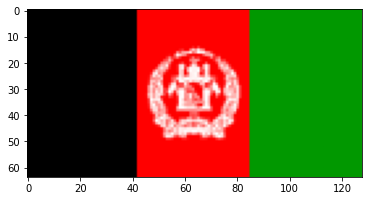

In [23]:
example = mpimage.imread(images_path + df["flag_128"][0])
plt.imshow(example)
example = module.preprocess_input(example)
min_size = min(example.shape[:2])
resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
resized_example = np.expand_dims(resized_example, axis=0)
preds = seq2.predict(resized_example)
print(preds)
df["name"][preds.argmax()]

[[0.19513468 0.5348442  0.18340904 0.0866121 ]]


'Albania'

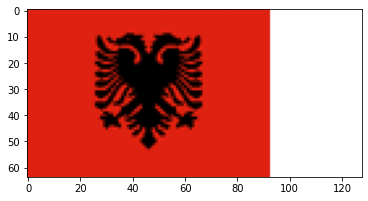

In [24]:
example = mpimage.imread(images_path + df["flag_128"][1])
plt.imshow(example)
example = module.preprocess_input(example[:, :, :3])
min_size = min(example.shape[:2])
resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
resized_example = np.expand_dims(resized_example, axis=0)
preds = seq2.predict(resized_example)
print(preds)
df["name"][preds.argmax()]

[[0.2668498  0.41846654 0.20621389 0.10846978]]


'Albania'

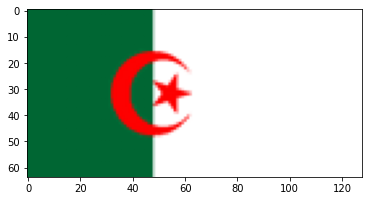

In [25]:
example = mpimage.imread(images_path + df["flag_128"][2])
plt.imshow(example)
example = module.preprocess_input(example[:, :, :3])
min_size = min(example.shape[:2])
resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
resized_example = np.expand_dims(resized_example, axis=0)
preds = seq2.predict(resized_example)
print(preds)
df["name"][preds.argmax()]

array([[0.2683446 , 0.46742687, 0.1577254 , 0.10650307]], dtype=float32)

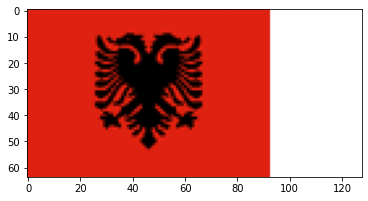

In [26]:
example = mpimage.imread(images_path + df["flag_128"][1])
plt.imshow(example)
example = module.preprocess_input(example[:, :, :3] / 255)
min_size = min(example.shape[:2])
resized_example = cv2.resize(example[:min_size, :min_size], (width, height))
resized_example = np.expand_dims(resized_example, axis=0)
seq2.predict(resized_example)

In [78]:
pred3 = seq2.predict(batch)

In [153]:
preds_batch.argmax(axis=1)

array([1, 3, 3, 3, 3, 1, 3, 1, 3, 1, 3, 1, 1, 0, 3, 1])

In [68]:
pred1 = seq2.call(tf.Variable(batch, dtype=tf.float32), training=True)
pred2 = seq2.call(tf.Variable(batch, dtype=tf.float32), training=False)
pred1 == pred2, pred3 == pred1

In [300]:
from keras import backend as K

In [371]:
K.set_learning_phase(1)

In [370]:
K.learning_phase()

0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


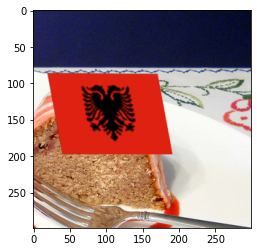

Predicted: 2 Algeria | Actual: 2 Algeria


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


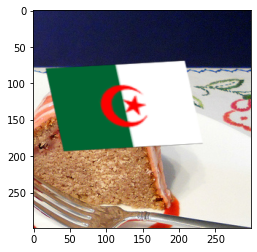

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 0 Afghanistan | Actual: 0 Afghanistan


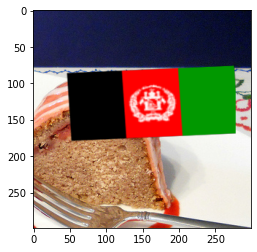

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 0 Afghanistan | Actual: 0 Afghanistan


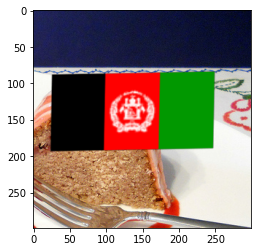

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 0 Afghanistan | Actual: 0 Afghanistan


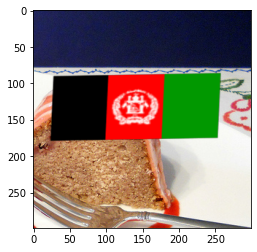

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 2 Algeria | Actual: 2 Algeria


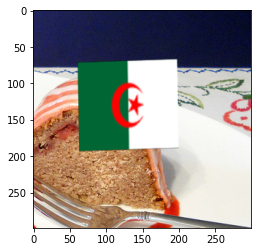

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 3 Andorra | Actual: 3 Andorra


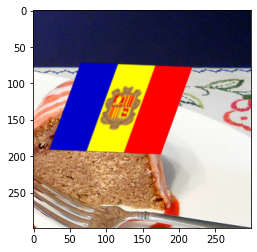

Predicted: 3 Andorra | Actual: 3 Andorra


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


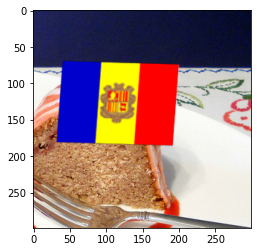

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 3 Andorra | Actual: 3 Andorra


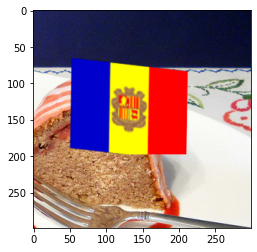

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 0 Afghanistan | Actual: 0 Afghanistan


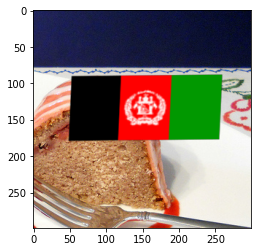

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 0 Afghanistan | Actual: 0 Afghanistan


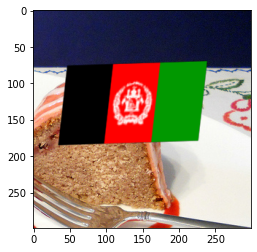

Predicted: 2 Algeria | Actual: 2 Algeria


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


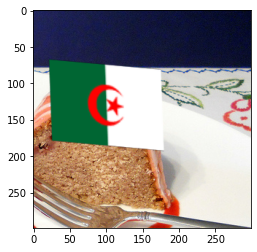

Predicted: 2 Algeria | Actual: 2 Algeria


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


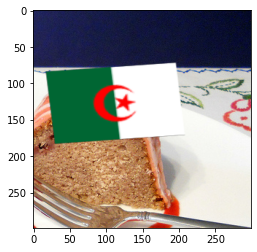

Predicted: 0 Afghanistan | Actual: 1 Albania


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


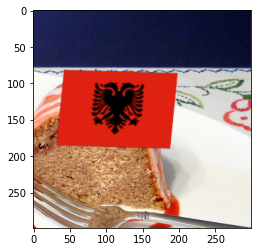

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 3 Andorra | Actual: 3 Andorra


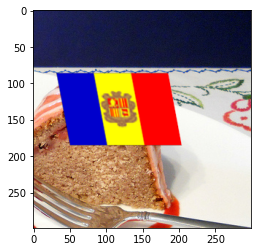

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


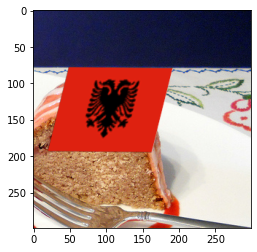

In [27]:
for i, im in enumerate(batch):
    pred_idx = preds_batch.argmax(axis=1)[i]
    act_idx = y_batch.argmax(axis=1)[i]
    print("Predicted:", pred_idx, df.loc[pred_idx]["name"], "| Actual:", act_idx, df.loc[act_idx]["name"])
    plt.imshow((im + 1) * 0.5 * 256)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 3 Andorra


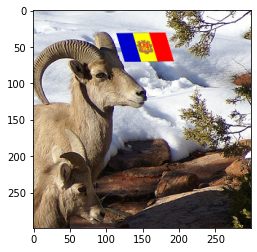

Predicted: 1 Albania | Actual: 1 Albania


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


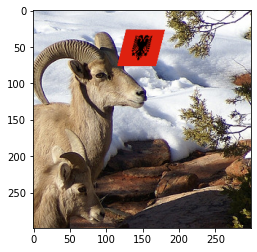

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 2 Algeria


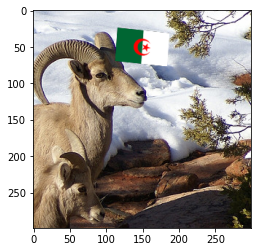

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


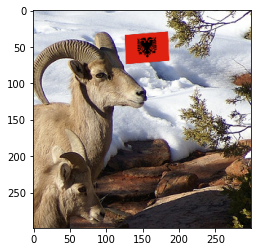

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 0 Afghanistan


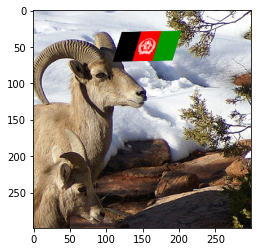

Predicted: 1 Albania | Actual: 0 Afghanistan


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


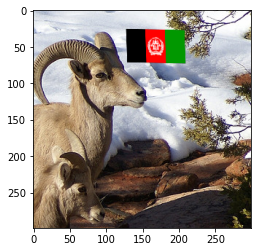

Predicted: 1 Albania | Actual: 2 Algeria


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


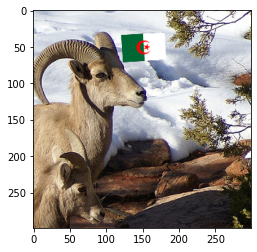

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 2 Algeria


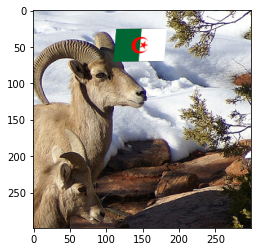

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 2 Algeria


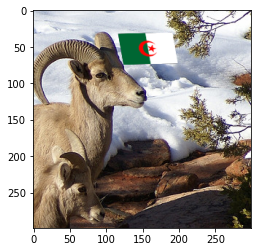

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 2 Algeria


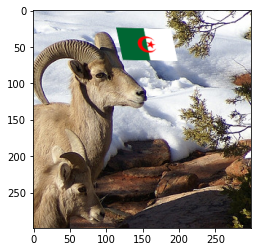

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


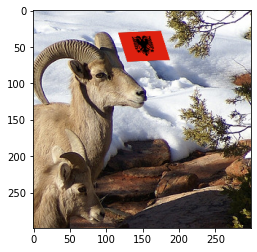

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


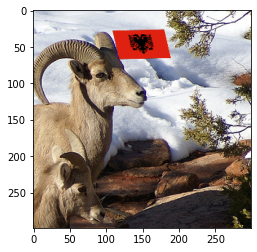

Predicted: 1 Albania | Actual: 1 Albania


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


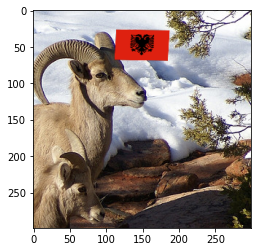

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: 1 Albania | Actual: 1 Albania


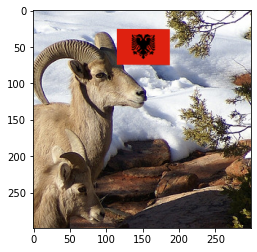

Predicted: 1 Albania | Actual: 1 Albania


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


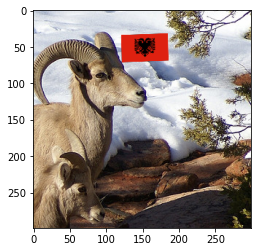

Predicted: 1 Albania | Actual: 2 Algeria


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


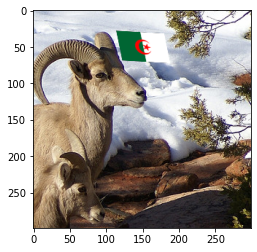

In [30]:
for i, im in enumerate(batch):
    pred_idx = preds_batch.argmax(axis=1)[i]
    act_idx = y_batch.argmax(axis=1)[i]
    print("Predicted:", pred_idx, df.loc[pred_idx]["name"], "| Actual:", act_idx, df.loc[act_idx]["name"])
    plt.imshow((im + 1) * 0.5 * 256)
    plt.show()

In [12]:
def train_gen(batch_size):
    while True:
        sample = random.sample(range(n_classes), batch_size)
        sample = [0]
        yield images[sample], y[sample]

In [110]:
batch_size = 2

In [85]:
seq2.compile("adam", loss="categorical_crossentropy", metrics=["accuracy"])

In [86]:
seq2.fit_generator(train_gen(batch_size), validation_data=[images, y], epochs=10, steps_per_epoch=0.1 * 800//batch_size)

Epoch 1/10
40/40 [==============================] - 7s 168ms/step - loss: 0.0245 - accuracy: 1.0000 - val_loss: 2.3367 - val_accuracy: 0.5000
Epoch 2/10
40/40 [==============================] - 3s 82ms/step - loss: 1.0535e-05 - accuracy: 1.0000 - val_loss: 2.3779 - val_accuracy: 0.5000
Epoch 3/10
40/40 [==============================] - 3s 85ms/step - loss: 9.7960e-06 - accuracy: 1.0000 - val_loss: 2.3805 - val_accuracy: 0.5000
Epoch 4/10
40/40 [==============================] - 4s 90ms/step - loss: 9.6708e-06 - accuracy: 1.0000 - val_loss: 2.3825 - val_accuracy: 0.5000
Epoch 5/10
25/40 [=================>............] - ETA: 1s - loss: 9.5653e-06 - accuracy: 1.0000

KeyboardInterrupt: 

In [51]:
preds = seq2.predict(images)

In [25]:
idx_pred = pd.DataFrame(preds).idxmax(axis=1)

In [26]:
(idx_pred == idx_pred.index).mean()

0.5

In [27]:
idx_pred

0    0
1    0
dtype: int64

In [28]:
(y * np.log(preds)).sum() / n_classes

-0.8702804893255234

In [245]:
import random

In [250]:
list(images)[0].shape

(299, 299, 3)

In [251]:
images_lst = list(images)

In [100]:
mod_test = models.Sequential()
mod_test.add(BatchNormalization())
mod_test.compile(optimizer="adam", loss="mse")

In [173]:
mod_test.fit(img, img, epochs=100)

Epoch 1/100
299/299 [==============================] - 0s 55us/step - loss: 3.5830e-09
Epoch 2/100
299/299 [==============================] - 0s 55us/step - loss: 5.1950e-09
Epoch 3/100
299/299 [==============================] - 0s 59us/step - loss: 2.2476e-09
Epoch 4/100
299/299 [==============================] - 0s 53us/step - loss: 4.4330e-09
Epoch 5/100
299/299 [==============================] - 0s 58us/step - loss: 1.3644e-08
Epoch 6/100
299/299 [==============================] - 0s 60us/step - loss: 5.3276e-09
Epoch 7/100
299/299 [==============================] - 0s 56us/step - loss: 3.9540e-09
Epoch 8/100
299/299 [==============================] - 0s 52us/step - loss: 3.8519e-09
Epoch 9/100
299/299 [==============================] - 0s 52us/step - loss: 2.5697e-09
Epoch 10/100
299/299 [==============================] - 0s 52us/step - loss: 2.5437e-09
Epoch 11/100
299/299 [==============================] - 0s 52us/step - loss: 4.4069e-09
Epoch 12/100
299/299 [===================

In [161]:
a = mod_test.layers[0]
a.weights

[<tf.Variable 'batch_normalization_190/gamma:0' shape=(3,) dtype=float32, numpy=array([0.03180087, 0.03180738, 0.03183525], dtype=float32)>,
 <tf.Variable 'batch_normalization_190/beta:0' shape=(3,) dtype=float32, numpy=array([-0.99369246, -0.9972158 , -0.99748564], dtype=float32)>,
 <tf.Variable 'batch_normalization_190/moving_mean:0' shape=(3,) dtype=float32, numpy=array([-0.99374056, -0.9972685 , -0.9975391 ], dtype=float32)>,
 <tf.Variable 'batch_normalization_190/moving_variance:0' shape=(3,) dtype=float32, numpy=array([4.7411804e-06, 9.7673947e-06, 1.0937897e-05], dtype=float32)>]

In [174]:
mod_test.layers[0].get_weights()

[array([0.03170048, 0.03177727, 0.03179494], dtype=float32),
 array([-0.993739  , -0.99726814, -0.9975388 ], dtype=float32),
 array([-0.9937396 , -0.99726826, -0.9975389 ], dtype=float32),
 array([4.7349745e-06, 9.7667617e-06, 1.0937613e-05], dtype=float32)]

In [180]:
gamma, beta, mmean,mvar = mod_test.layers[0].get_weights()

In [181]:
pred_img = mod_test.predict(img)

In [182]:
((pred_img - img) ** 2).mean()

1.3701391e-13

In [188]:
(((img[:, :, 0] - mmean[0]) / ((mvar[0] + 0.001) ** 0.5)) * gamma[0] + beta[0] - pred_img[:, :, 0] ).min()

-5.9604645e-08

In [184]:
(((img[:, :, 0] - mmean[0]) / ((mvar[0] + 0.001) ** 0.5)) * gamma[0] + beta[0] - img[:, :, 0] )

array([[6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07],
       [6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07],
       [6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07],
       ...,
       [6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07],
       [6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07],
       [6.5565109e-07, 6.5565109e-07, 6.5565109e-07, ..., 7.1525574e-07,
        7.1525574e-07, 7.1525574e-07]], dtype=float32)

In [ ]:
(((img[:, :, 0] - mmean[0]) / ((mvar[0] + 0.001) ** 0.5)) * gamma[0] + beta[0] - pred_img[:, :, 0] )

In [163]:
mmean[0]

-0.9937453

In [164]:
mvar[0]

4.758958e-06

In [165]:
gamma[0]

0.04396372

In [170]:
 ((mvar[0] + 0.001) ** 0.5) / gamma[0]

0.7210020814421719

In [169]:
beta[0]

-0.9845544